In [1]:
from spectrum import *
from pylab import *
import librosa
import librosa.display
from numpy import loadtxt
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.signal import welch
import IPython.display as ipd
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.stattools import pacf
from statsmodels.regression.linear_model import yule_walker
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error
import sys
import scipy

In [2]:
sr=8000

In [3]:
kond = loadtxt('kond.csv', delimiter=',')
tond = loadtxt('tond.csv', delimiter=',')

In [4]:
print(f"number of samples for slow sound:  {len(kond)}")
print(f"number of samples for fast sound:  {len(tond)}")

number of samples for slow sound:  1244900
number of samples for fast sound:  1448000


In [5]:
db20 = lambda x: np.log10(np.abs(x)) * 20

In [6]:
def normalize(sig, rms_level=0):

    r = 10**(rms_level / 10.0)
    a = np.sqrt( (len(sig) * r**2) / np.sum(sig**2) )

    # normalize
    y = sig * a

    return y

In [7]:
kond_normal = normalize(kond)
tond_normal = normalize(tond)
print("mean kond:        {} , var kond:        {}".format(np.mean(kond),np.var(kond)))
print("mean kond_normal: {} , var kond_normal: {}".format(np.mean(kond_normal),np.var(kond_normal)))
print("mean tond:        {} , var tond:        {}".format(np.mean(tond),np.var(tond)))
print("mean tond_normal: {} , var tond_normal: {}".format(np.mean(tond_normal),np.var(tond_normal)))

mean kond:        -2.6159296057076103e-05 , var kond:        0.0008608301989509982
mean kond_normal: -0.0008915939919609729 , var kond_normal: 0.9999992050601534
mean tond:        -0.00412503821332595 , var tond:        0.024672496904700077
mean tond_normal: -0.02625256338212519 , var tond_normal: 0.9993108029158679


In [8]:
ipd.Audio(kond_normal,rate=8000)

In [9]:
ipd.Audio(tond_normal,rate=8000)

# select random sample

In [10]:
def choose_sample(signal,n=100000):
    a = np.arange(len(signal))
    np.random.shuffle(a)
    index=np.sort(a[:n])
    print(index)
    return signal[index]

In [11]:
kond_normal_t = choose_sample(kond_normal,100000)
tond_normal_t = choose_sample(tond_normal,100000)

[     10      14      27 ... 1244841 1244859 1244862]
[      1       6       7 ... 1447983 1447986 1447992]


# spectrogram

In [12]:
def plot_spectrogram(Y, sr, n_fft , hop_length , window='hann',title="no"):
    
    S = np.abs(librosa.stft(Y, n_fft=n_fft, hop_length=hop_length,window=window))**2
    S_db = librosa.power_to_db(S)
    #print(len(S_db))
    
    fig, ax = plt.subplots(figsize=(15, 8))
    #plt.figure(figsize=(15, 8))
    img = librosa.display.specshow(S_db, 
                                   sr=sr, 
                                   hop_length=hop_length, 
                                   x_axis="time", 
                                   y_axis="log",
                                   ax=ax
                                   )
    ax.set(title=title)
    fig.colorbar(img, ax=ax, format="%+2.f dB")


In [13]:
#initial value
sr = 8000
n_fft=1024
hop_length=1024

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


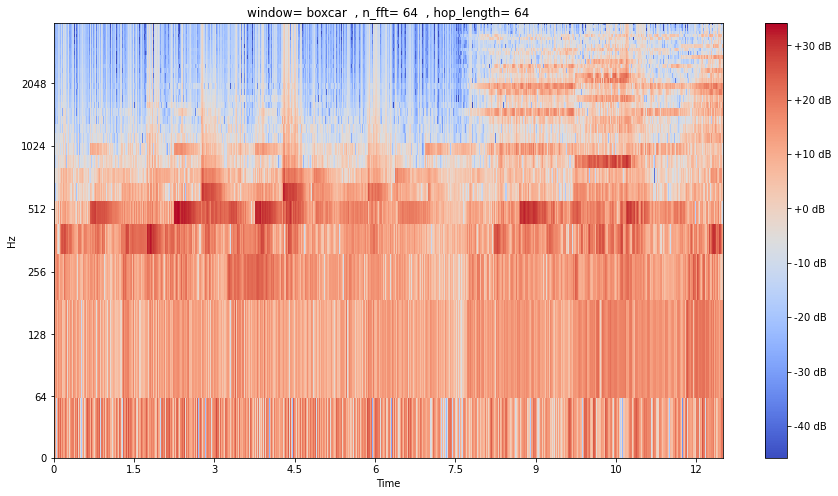

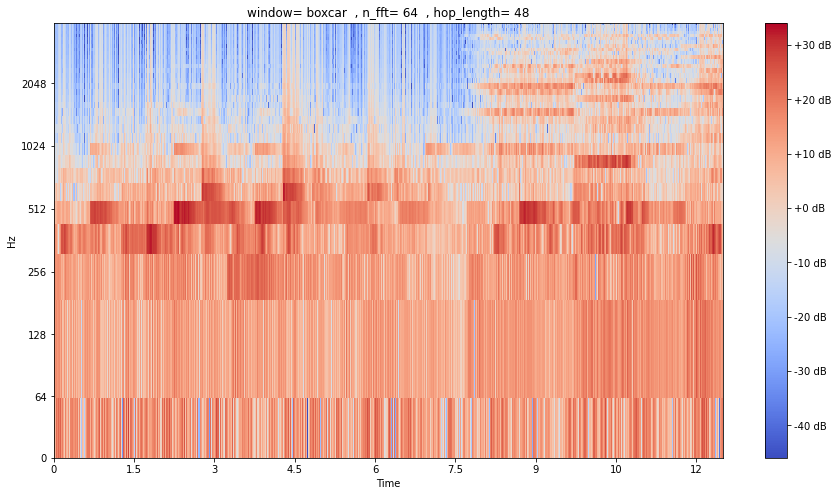

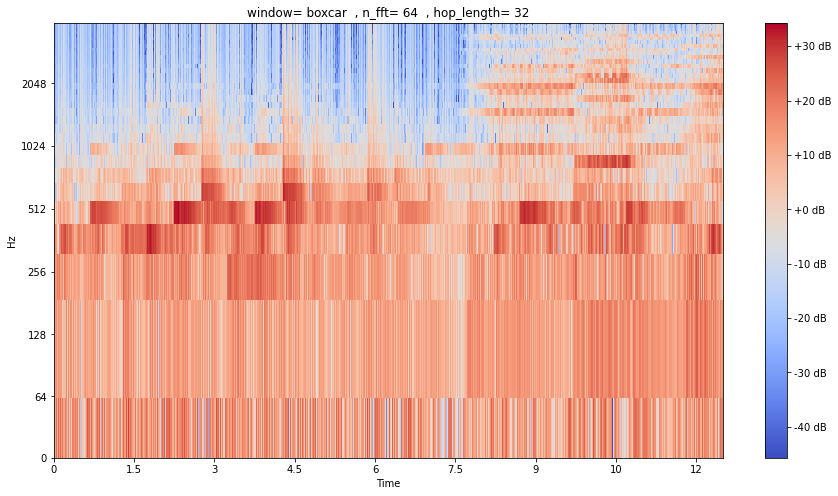

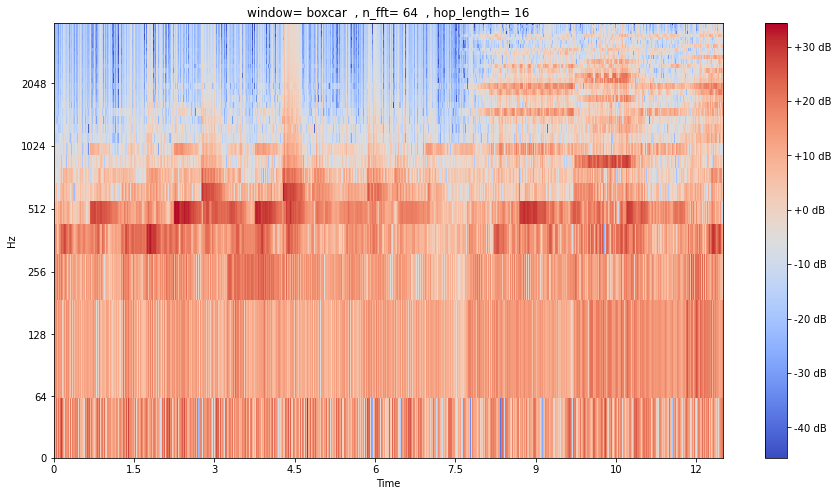

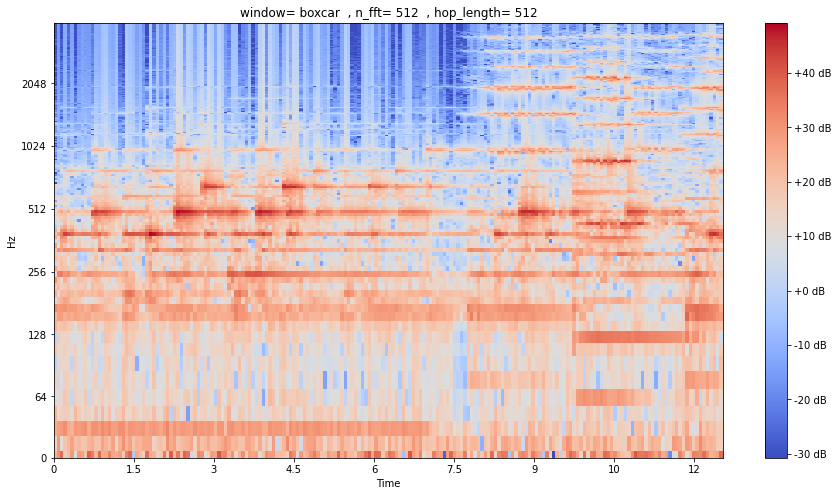

...

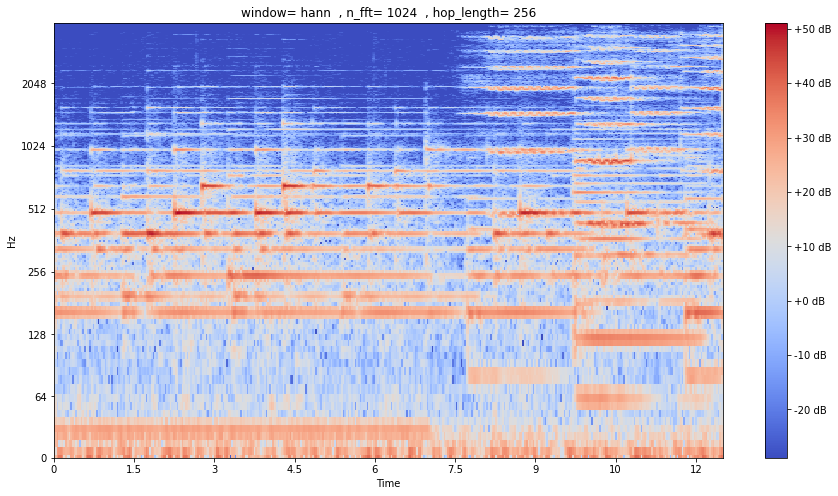

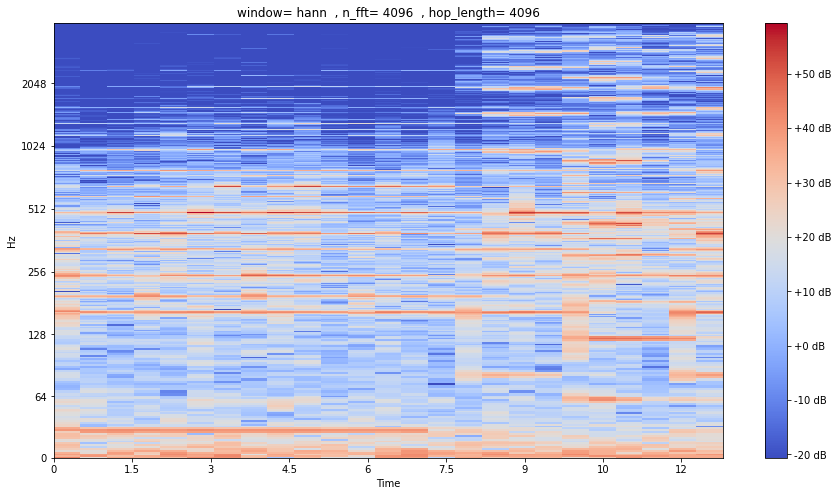

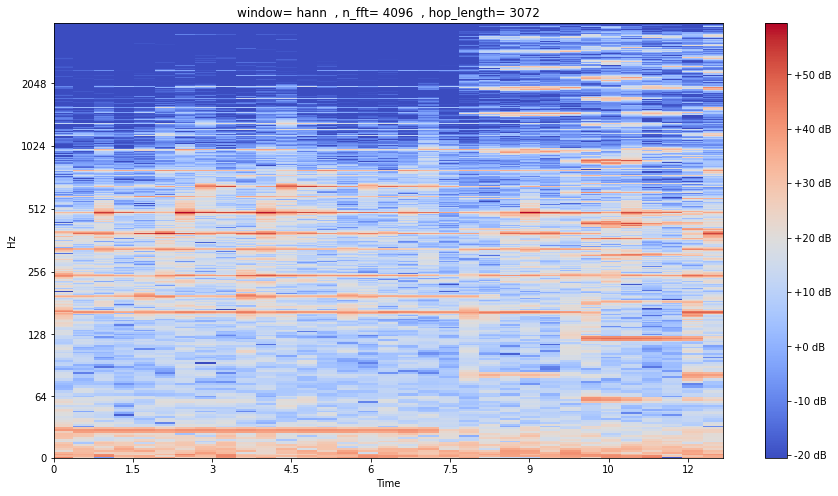

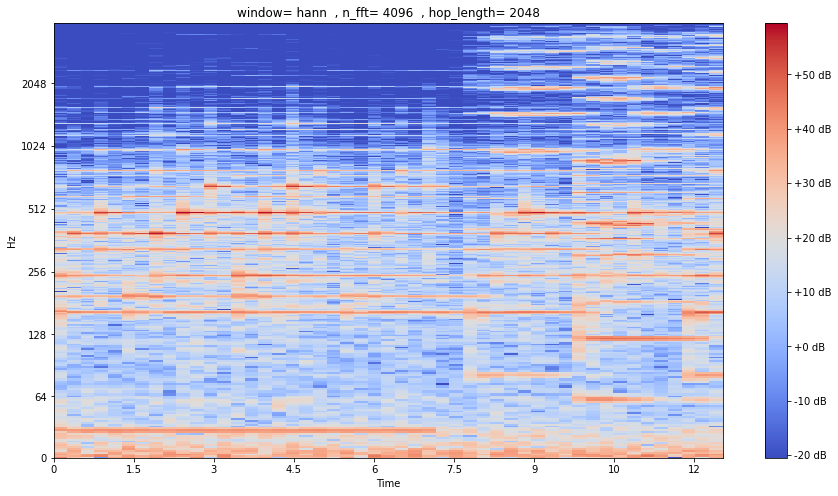

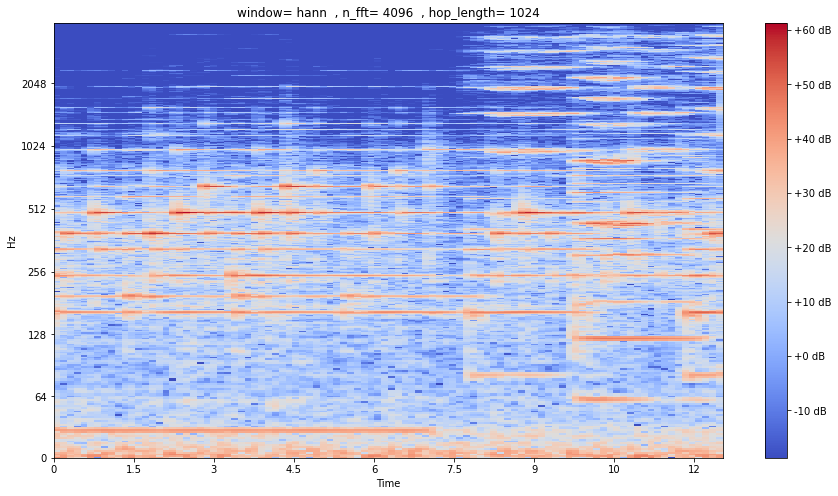

In [14]:

for win in ['boxcar','triang','hamming','hann']:
    for n_fft in [64,512,1024,4096]:
        for i in [1,.75,.5,.25]:
            hop_length = int(i*n_fft)
            title = "window= {}  , n_fft= {}  , hop_length= {}".format(win,n_fft,hop_length)
            #print(title)
            plot_spectrogram(kond_normal[200000:300000], sr, n_fft , hop_length , window=win,title=title)
          


## compare

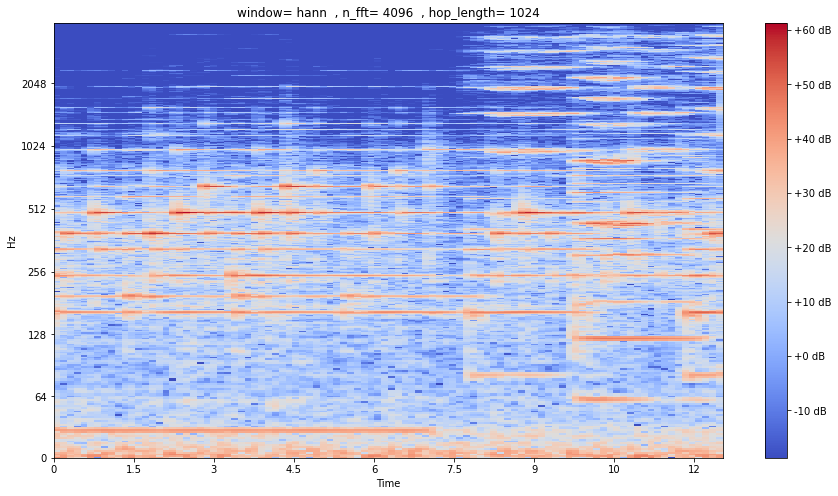

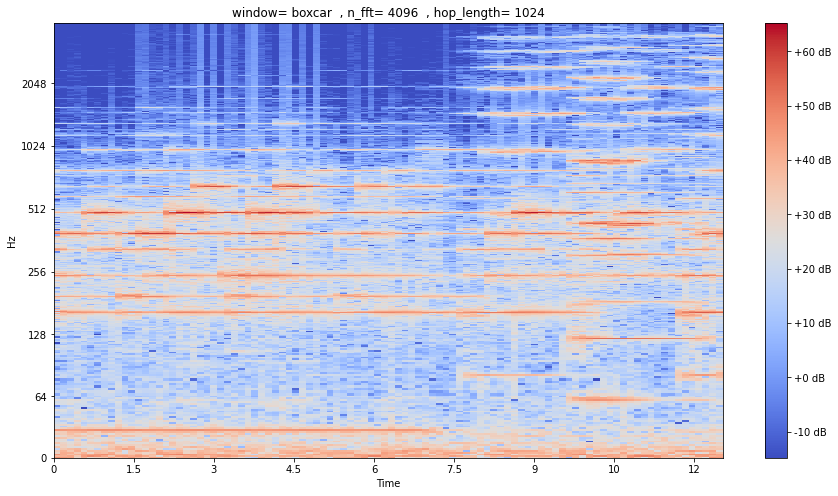

In [15]:
sr=8000;n_fft=4096;hop_length=1024;win='hann'
title = "window= {}  , n_fft= {}  , hop_length= {}".format(win,n_fft,hop_length)
plot_spectrogram(kond_normal[200000:300000], sr, n_fft , hop_length , window=win,title=title)

sr=8000;n_fft=4096;hop_length=1024;win='boxcar'
title = "window= {}  , n_fft= {}  , hop_length= {}".format(win,n_fft,hop_length)
plot_spectrogram(kond_normal[200000:300000], sr, n_fft , hop_length , window=win,title=title)
          

# peridogram


In [16]:
def peridogram_original (signal,nperseg,noverlap,title,t):
    (fWelch, pWelch) = welch(signal, nperseg=nperseg, noverlap=noverlap)
    if t:
        return  (fWelch, pWelch)
    fig, ax = plt.subplots(figsize=(15, 8))
    ax.set(xlabel='frequency (Hz)',ylabel='spectrum estimate',title=title)
    ax.plot(fWelch, db20(pWelch))
    

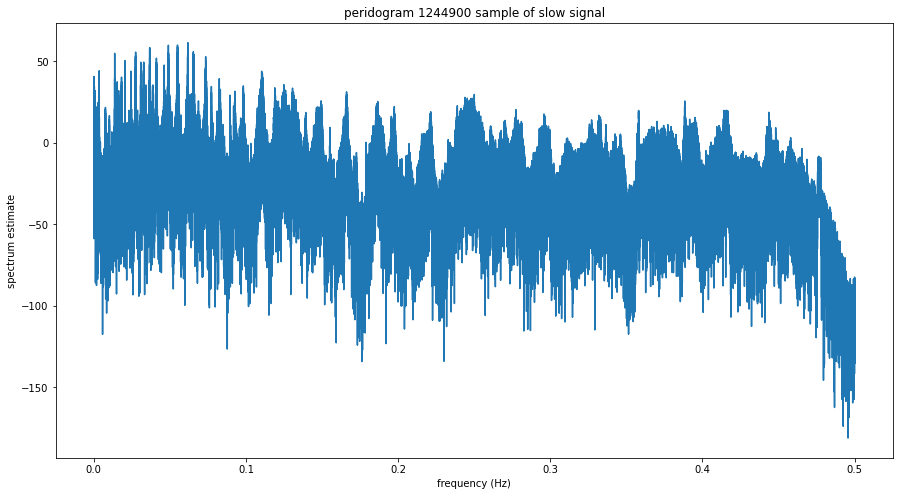

In [17]:
peridogram_original(kond_normal,nperseg=len(kond_normal),noverlap=0,title=f"peridogram {len(kond_normal)} sample of slow signal",t=0)

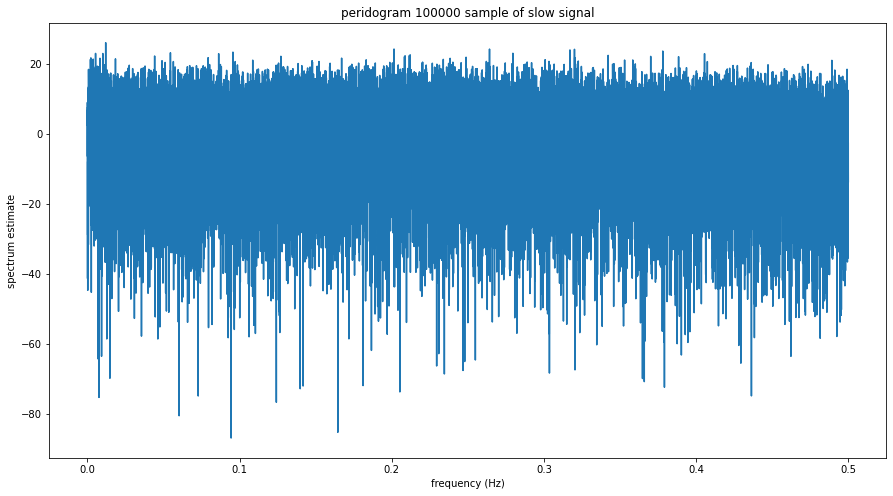

In [18]:
peridogram_original(kond_normal_t,nperseg=len(kond_normal_t),noverlap=0,title=f"peridogram {len(kond_normal_t)} sample of slow signal",t=0)

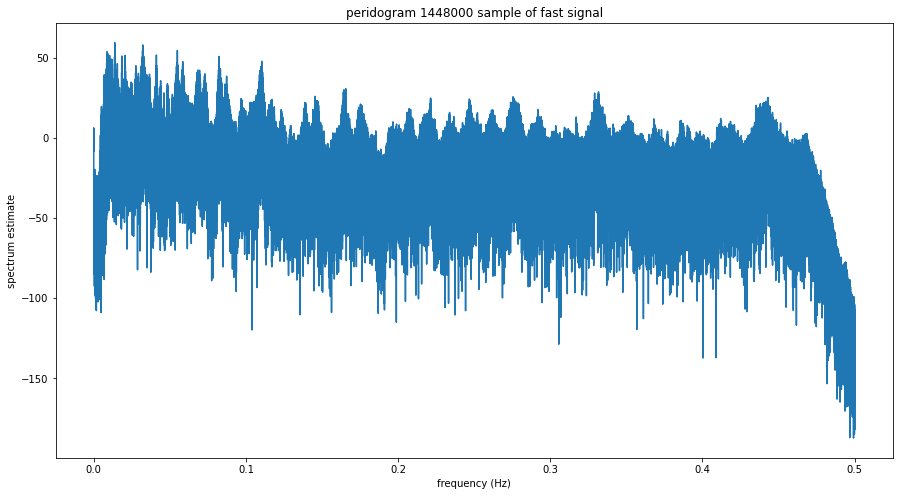

In [19]:
peridogram_original(tond_normal,nperseg=len(tond_normal),noverlap=0,title=f"peridogram {len(tond_normal)} sample of fast signal",t=0)

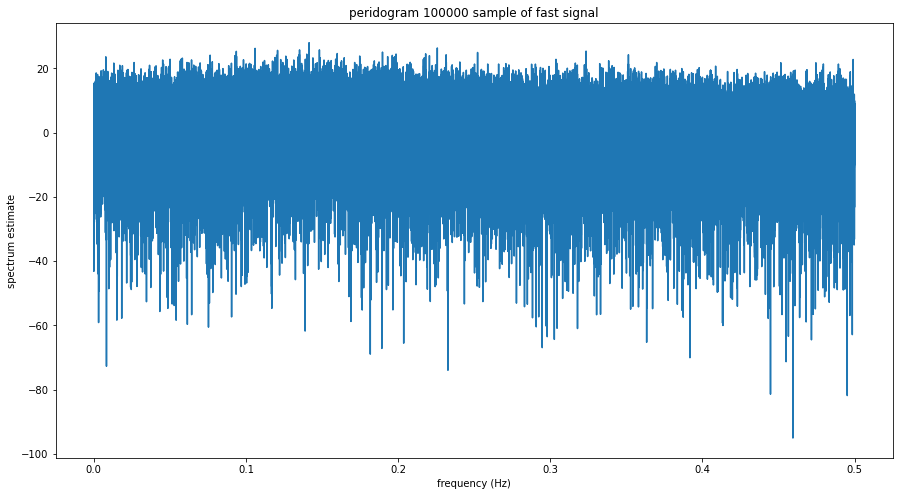

In [20]:
peridogram_original(tond_normal_t,nperseg=len(tond_normal_t),noverlap=0,title=f"peridogram {len(tond_normal_t)} sample of fast signal",t=0)

## Bartlet

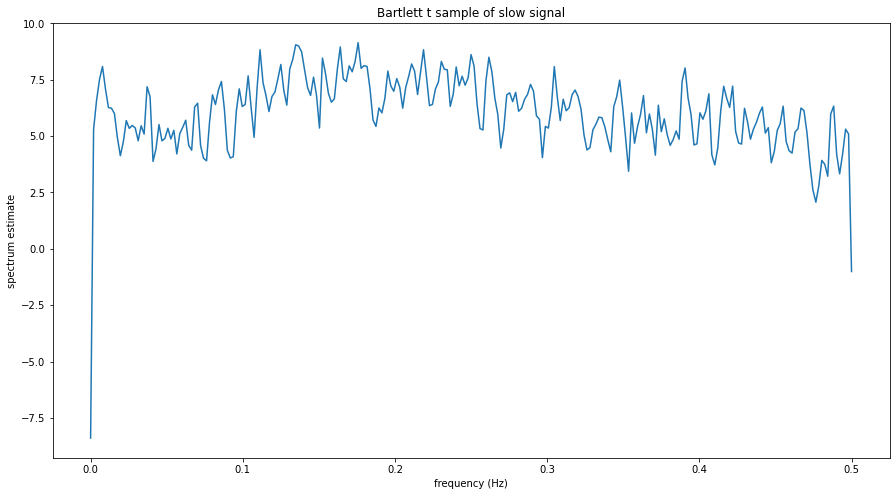

In [21]:
peridogram_original(kond_normal_t,nperseg=512,noverlap=0,title="Bartlett t sample of slow signal",t=0)

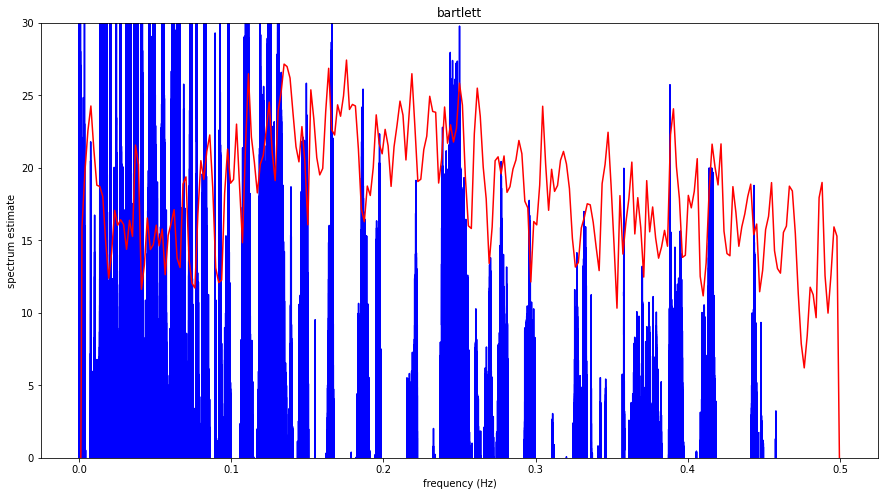

In [22]:
(fb, pb) = peridogram_original(kond_normal_t,nperseg=512,noverlap=0,title="Bartlett t sample of slow signal",t=1)
(fp, pp) = peridogram_original(kond_normal,nperseg=len(kond_normal),noverlap=0,title=f"peridogram {len(kond_normal)} sample of slow signal",t=1)
fig, ax = plt.subplots(figsize=(15, 8))
ax.set(xlabel='frequency (Hz)',ylabel='spectrum estimate',title="bartlett",ylim=(0,30))
ax.plot(fp,db20(pp),'b-',fb, db20(pb)*3,'r-')



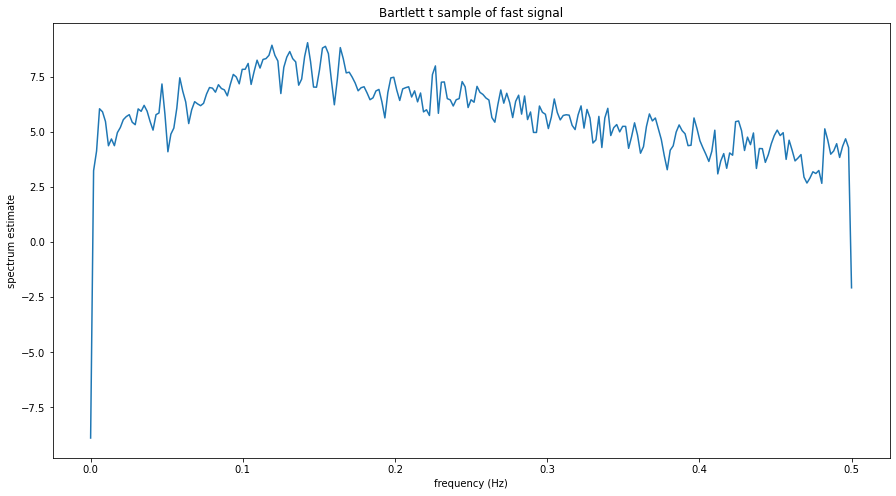

In [23]:
peridogram_original(tond_normal_t,nperseg=512,noverlap=0,title="Bartlett t sample of fast signal",t=0)

## welch

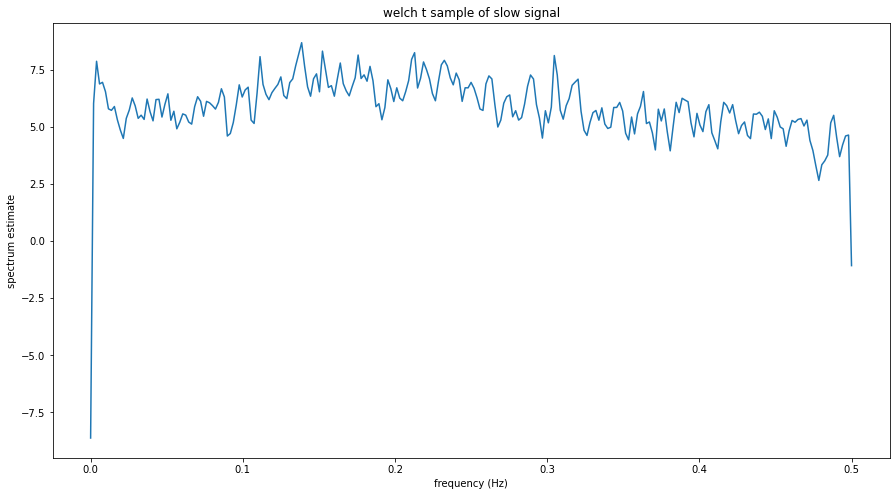

In [24]:
peridogram_original(kond_normal_t,nperseg=512,noverlap=256,title="welch t sample of slow signal",t=0)

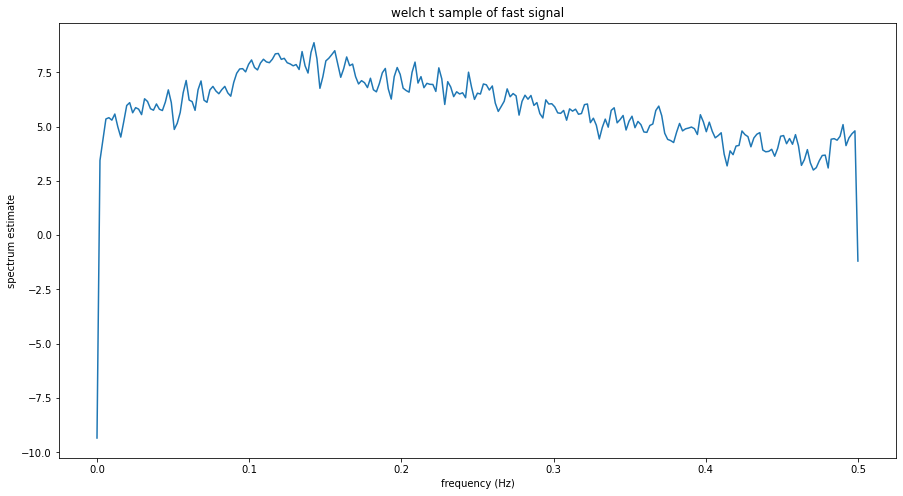

In [25]:
peridogram_original(tond_normal_t,nperseg=512,noverlap=256,title="welch t sample of fast signal",t=0)

## Blackman-tukey

In [26]:
from scipy.signal import correlate
from scipy.signal import hamming
import numpy.fft as fft

db20 = lambda x: np.log10(np.abs(x)) * 20

def acorrBiased(y):
  """Obtain the biased autocorrelation and its lags
  """
  r = correlate(y, y) / len(y)
  l = np.arange(-(len(y)-1), len(y))
  return r,l

# This is a port of the code accompanying Stoica & Moses' "Spectral Analysis of
# Signals" (Pearson, 2005): http://www2.ece.ohio-state.edu/~randy/SAtext/
def blackmanTukey(y, w, Nfft, fs=1):
  """Evaluate the Blackman-Tukey spectral estimator

  Parameters
  ----------
  y : array_like
      Data
  w : array_like
      Window, of length <= y's
  Nfft : int
      Desired length of the returned power spectral density estimate. Specifies
      the FFT-length.
  fs : number, optional
      Sample rate of y, in samples per second. Used only to scale the returned
      vector of frequencies.

  Returns
  -------
  phi : array
      Power spectral density estimate. Contains ceil(Nfft/2) samples.
  f : array
      Vector of frequencies corresponding to phi.

  References
  ----------
  P. Stoica and R. Moses, *Spectral Analysis of Signals* (Pearson, 2005),
  section 2.5.1. See http://www2.ece.ohio-state.edu/~randy/SAtext/ for original
  Matlab code. See http://user.it.uu.se/~ps/SAS-new.pdf for book contents.
  """
  M = len(w)
  N = len(y)
  if M>N:
    raise ValueError('Window cannot be longer than data')
  r, lags = acorrBiased(y)
  r = r[np.logical_and(lags >= 0, lags < M)]
  rw = r * w
  phi = 2 * fft.fft(rw, Nfft).real - rw[0];
  f = np.arange(Nfft) / Nfft;
  return (phi[f < 0.5], f[f < 0.5] * fs)

In [27]:
def bT_stimation(signalk,title):
    btWin = signal.triang(100)
    (pBT, fBT) = blackmanTukey(signalk, btWin, 1024)
    #pBT = pBT**2
    fig, ax = plt.subplots(figsize=(15, 8))
    ax.set(xlabel='frequency (Hz)',ylabel='spectrum estimate',title=title)
    plt.plot(fBT, db20(pBT))

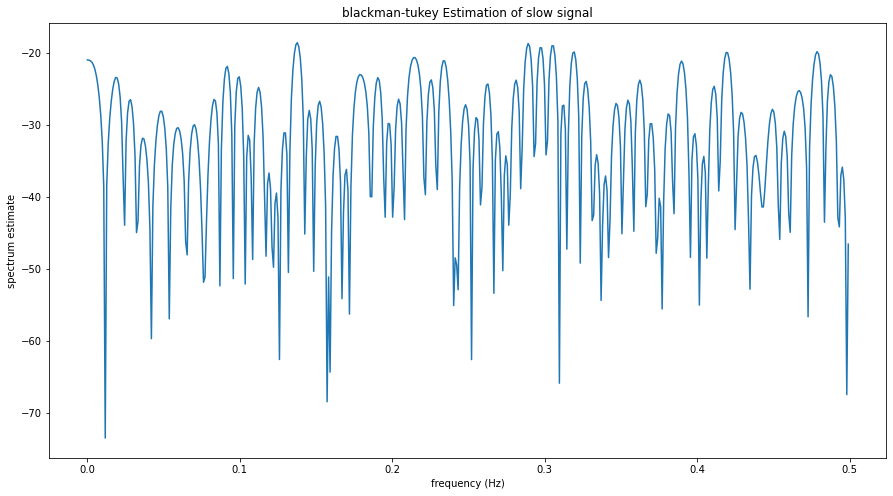

In [28]:
bT_stimation(kond_normal_t,"blackman-tukey Estimation of slow signal")

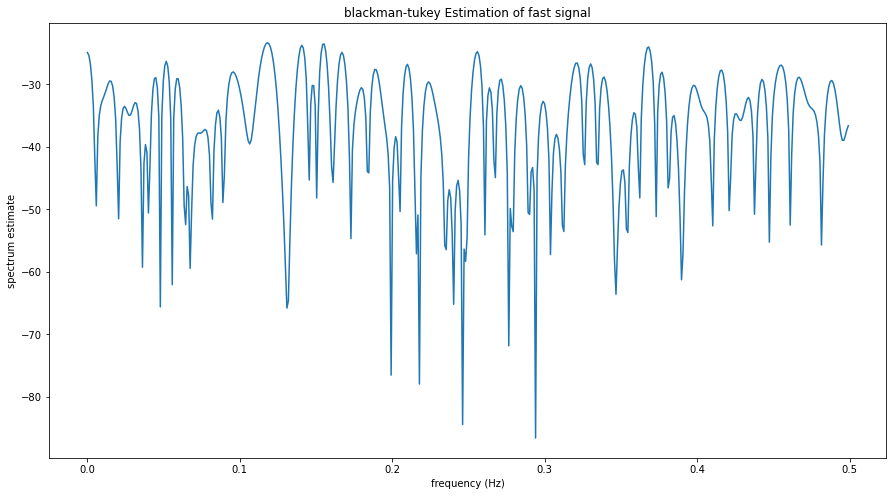

In [29]:
bT_stimation(tond_normal_t,"blackman-tukey Estimation of fast signal")

# parametric signal modeling

## AR()

In [30]:
def AR_est(sig,n=15):
    p = pyule(sig, n, NFFT=None)
    p()
    figure(figsize=(15,8))
    p.plot()
    

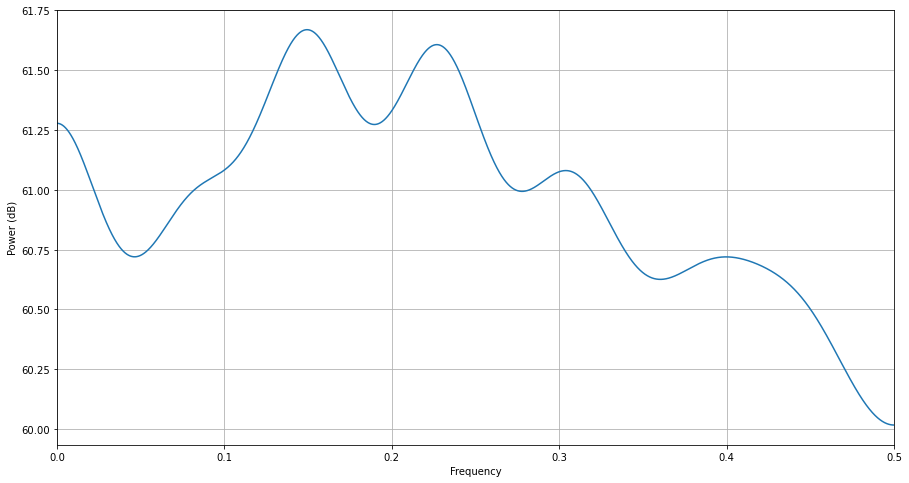

In [31]:
AR_est(kond_normal_t,15)

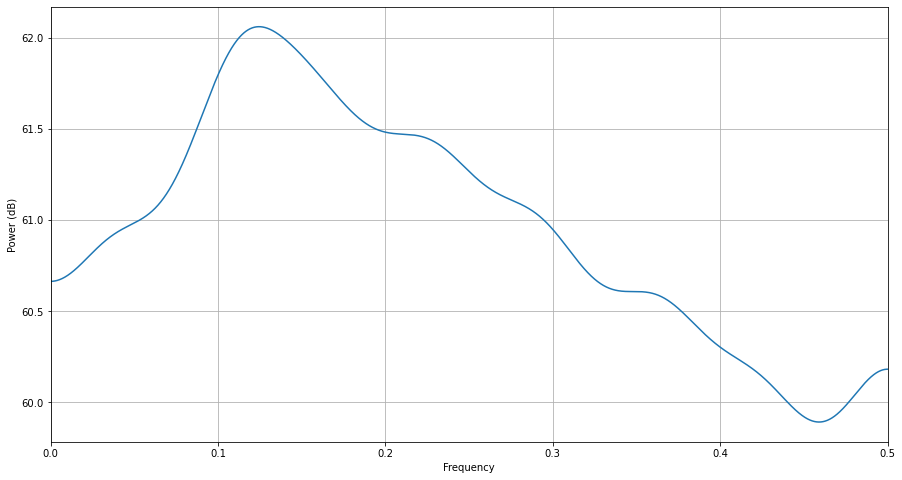

In [32]:
AR_est(tond_normal_t,15)

## ARMA()

(-50.0, 0.0)

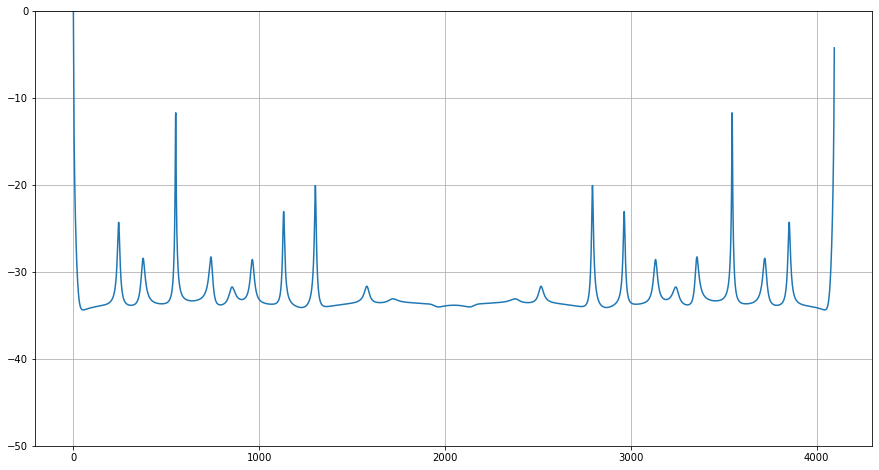

In [33]:
a,b, rho = arma_estimate(kond_normal_t, 30, 30, 60)
psd = arma2psd(A=a, B=b, rho=rho, norm=True)
figure(figsize=(15,8))
grid()
plot(10 * log10(psd))
ylim([-50,0])

# signal estimation

**** ravash zir eshtebah ast****
lotfan function bad ro bekhonin

In [34]:
def xt_compare (sig,had=5):
    error = []
    for u in range(2,had+1):
        print("number of P= {}".format(u))
        ar,_= yule_walker(sig,u,method='mle')
        ar = ar
        print("ar_p= {}".format(ar))
        x_es=[]
        for n in range(len(ar),len(sig)):
            x_te = 0
            for i in range(0,len(ar)):
                x_te += (sig[n-len(ar)+i]*ar[len(ar)-i-1])
            x_es.append(x_te)
        
        error.append(mean_squared_error(x_es,sig[u:]))
    print(len(error))
    fig, ax = plt.subplots(figsize=(10,6))
    ax.set_title("error of estimated signal")
    ax.set_ylabel('MSE')
    ax.set_xlabel('number of pole')
    ax.plot(error,'-r')

number of P= 2
ar_p= [ 0.04210123 -0.04229428]
number of P= 3
ar_p= [ 0.0416331  -0.04182829 -0.01106834]
number of P= 4
ar_p= [ 0.04157394 -0.04205186 -0.01084582 -0.00534486]
number of P= 5
ar_p= [ 0.04163671 -0.0419245  -0.01035202 -0.00583305  0.01174265]
number of P= 6
ar_p= [ 0.04165185 -0.04193202 -0.01036537 -0.00588711  0.01179634 -0.00128958]
number of P= 7
ar_p= [ 0.04167073 -0.04210468 -0.0102792  -0.0057354   0.01241009 -0.00189923
  0.01463681]
number of P= 8
ar_p= [ 0.04161631 -0.04209762 -0.01032533 -0.00571408  0.01244831 -0.00174271
  0.0144819   0.00371758]
number of P= 9
ar_p= [ 0.04157616 -0.04225405 -0.01030651 -0.00584854  0.01251003 -0.00163118
  0.01493663  0.00326805  0.0108017 ]
number of P= 10
ar_p= [ 0.04158563 -0.04225118 -0.01029341 -0.00584997  0.012521   -0.0016363
  0.01492759  0.00323101  0.01083815 -0.00087679]
number of P= 11
ar_p= [ 0.04158077 -0.04219113 -0.01027551 -0.00576726  0.01251193 -0.00156693
  0.01489518  0.00317397  0.01060405 -0.000646

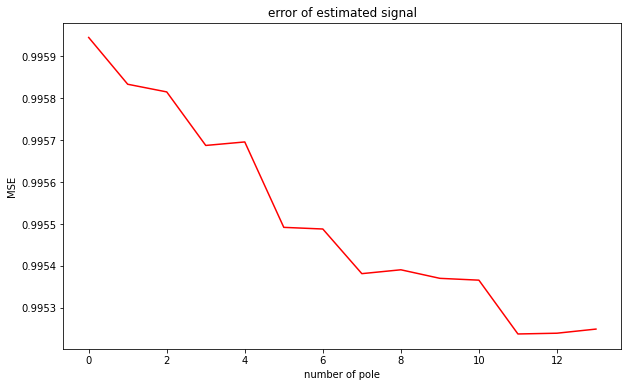

In [35]:
xt_compare(kond_normal_t,15)

##### tolid nemoone ba nemoone haye avale khode signal

In [36]:
def generate_compare (sig,had=5):
    error = []
    for u in range(2,had+1):
        print("number of P= {}".format(u))
        ar,_= yule_walker(sig,u,method='mle')
        sig_te = sig[:u]
        sig_te = sig_te.tolist()
        print("ar_p= {}".format(ar))
        #x_es=[]
        for n in range(len(ar),len(sig)):
            x_te = 0
            for i in range(0,len(ar)):
                x_te += (sig_te[n-len(ar)+i]*ar[len(ar)-i-1])
            sig_te.append(x_te)
        
        error.append(mean_squared_error(sig_te,sig))
    print(len(error))
    fig, ax = plt.subplots(figsize=(10,6))
    ax.set_title("error of estimated signal")
    ax.set_ylabel('MSE')
    ax.set_xlabel('number of pole')
    ax.plot(error,'-r')

number of P= 2
ar_p= [ 0.04210123 -0.04229428]
number of P= 3
ar_p= [ 0.0416331  -0.04182829 -0.01106834]
number of P= 4
ar_p= [ 0.04157394 -0.04205186 -0.01084582 -0.00534486]
number of P= 5
ar_p= [ 0.04163671 -0.0419245  -0.01035202 -0.00583305  0.01174265]
number of P= 6
ar_p= [ 0.04165185 -0.04193202 -0.01036537 -0.00588711  0.01179634 -0.00128958]
number of P= 7
ar_p= [ 0.04167073 -0.04210468 -0.0102792  -0.0057354   0.01241009 -0.00189923
  0.01463681]
number of P= 8
ar_p= [ 0.04161631 -0.04209762 -0.01032533 -0.00571408  0.01244831 -0.00174271
  0.0144819   0.00371758]
number of P= 9
ar_p= [ 0.04157616 -0.04225405 -0.01030651 -0.00584854  0.01251003 -0.00163118
  0.01493663  0.00326805  0.0108017 ]
number of P= 10
ar_p= [ 0.04158563 -0.04225118 -0.01029341 -0.00584997  0.012521   -0.0016363
  0.01492759  0.00323101  0.01083815 -0.00087679]
number of P= 11
ar_p= [ 0.04158077 -0.04219113 -0.01027551 -0.00576726  0.01251193 -0.00156693
  0.01489518  0.00317397  0.01060405 -0.000646

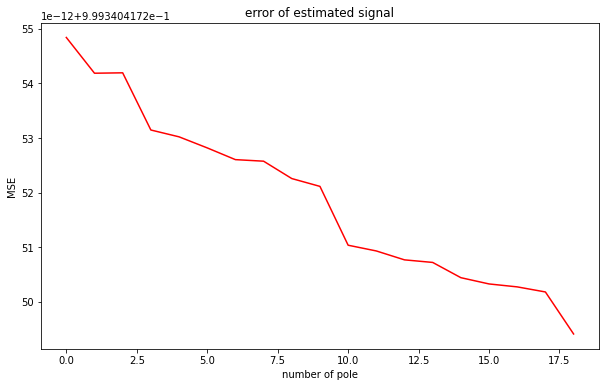

In [37]:
generate_compare(kond_normal_t,20)

number of P= 2
ar_p= [ 0.0797711  -0.05515794]
number of P= 3
ar_p= [ 0.07827181 -0.05298962 -0.02718175]
number of P= 4
ar_p= [ 0.07761666 -0.0542668  -0.02529521 -0.02410245]
number of P= 5
ar_p= [ 0.07729287 -0.05460661 -0.02602423 -0.02305976 -0.01343393]
number of P= 6
ar_p= [ 0.0772412  -0.05469531 -0.02612433 -0.02326979 -0.01313663 -0.0038464 ]
number of P= 7
ar_p= [ 0.0772463  -0.05467789 -0.02609347 -0.02323515 -0.0130641  -0.00394882
  0.00132603]
number of P= 8
ar_p= [ 0.07723256 -0.05463698 -0.02595812 -0.02299443 -0.01279377 -0.00338235
  0.00052575  0.0103601 ]
number of P= 9
ar_p= [ 0.07724075 -0.05463656 -0.0259608  -0.02300455 -0.01281195 -0.00340288
  0.00048254  0.01042118 -0.00079083]
number of P= 10
ar_p= [ 0.07724296 -0.05466566 -0.02596215 -0.02299505 -0.01277618 -0.00333865
  0.00055502  0.01057372 -0.00100648  0.00279191]
number of P= 11
ar_p= [ 0.077256   -0.05467036 -0.02591275 -0.02299246 -0.01279178 -0.00339834
  0.0004476   0.01045244 -0.00126185  0.00315

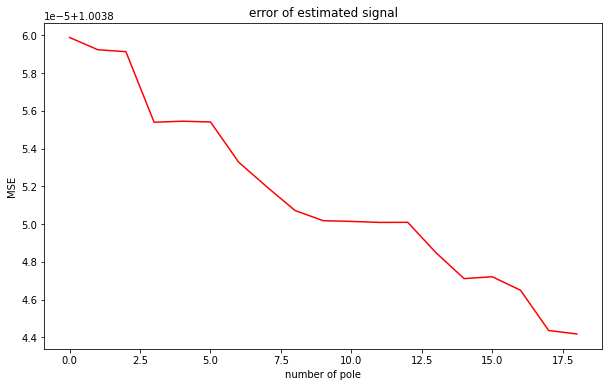

In [38]:
generate_compare(tond_normal_t,20)

# LPC

## Linear Prediction Coefficients via Burg’s method

In [39]:
def lpc_compare (sig,had=5,title="error of estimated signal"):
    error = []
    for u in range(2,had+1):
        print("number of P= {}".format(u))
        a = librosa.lpc(sig, u)
        b = np.hstack([[0], -1 * a[1:]])
        y_hat = scipy.signal.lfilter(b, [1],sig)
        
        error.append(mean_squared_error(y_hat,sig))
    print(len(error))
    fig, ax = plt.subplots(figsize=(10,6))
    ax.set_title(title)
    ax.set_ylabel('MSE')
    ax.set_xlabel('number of pole')
    ax.plot(error,'-r')

number of P= 2
number of P= 3
number of P= 4
number of P= 5
number of P= 6
number of P= 7
number of P= 8
number of P= 9
number of P= 10
number of P= 11
number of P= 12
number of P= 13
number of P= 14
number of P= 15
14


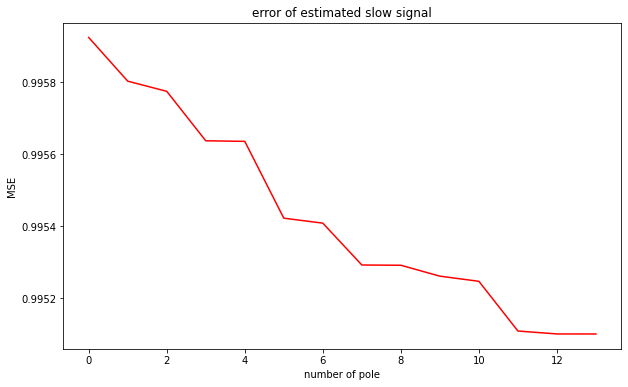

In [40]:
lpc_compare(kond_normal_t,15,"error of estimated slow signal")

number of P= 2
number of P= 3
number of P= 4
number of P= 5
number of P= 6
number of P= 7
number of P= 8
number of P= 9
number of P= 10
number of P= 11
number of P= 12
number of P= 13
number of P= 14
number of P= 15
14


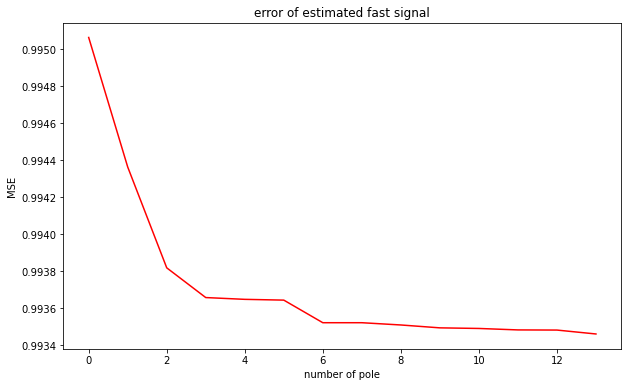

In [41]:
lpc_compare(tond_normal_t,15,"error of estimated fast signal")